#What Makes a Game on Steam Popular?

A look at data from Nik Davis https://www.kaggle.com/nikdavis/steam-store-games

In [1]:
import pandas as pd

df = pd.read_csv('data/steam.csv')

In [2]:
#take a look at the data
df.head()

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,3339,17612,317,10000000-20000000,7.19
1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,633,277,62,5000000-10000000,3.99
2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,398,187,34,5000000-10000000,3.99
3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,267,258,184,5000000-10000000,3.99
4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,288,624,415,5000000-10000000,3.99


In [3]:
df.columns

Index(['appid', 'name', 'release_date', 'english', 'developer', 'publisher',
       'platforms', 'required_age', 'categories', 'genres', 'steamspy_tags',
       'achievements', 'positive_ratings', 'negative_ratings',
       'average_playtime', 'median_playtime', 'owners', 'price'],
      dtype='object')

In [4]:
df['publisher'].nunique()

14354

In [5]:
df['developer'].nunique()

17113

In [6]:
release_d = pd.to_datetime(df['release_date'], infer_datetime_format=True)

In [7]:
#change datetimes to age in days for use in models
import datetime as dt
scrape_date = pd.to_datetime('06/01/2019')
scrape_date

age_in_days = scrape_date - release_d
df['age_in_days'] = age_in_days.dt.days
df['age_in_days']

0        6786
1        7366
2        5875
3        6574
4        7152
5        6786
6        7510
7        5570
8        6574
9        5310
10       5325
11       5478
12       3246
13       5325
14       4965
15       4779
16       4748
17       4252
18       4252
19       4252
20       3848
21       3481
22       2153
23       2966
24       3239
25       2475
26       4980
27       4827
28       3670
29       4770
         ... 
27045      40
27046      46
27047      45
27048      49
27049      59
27050      44
27051      43
27052      40
27053      38
27054      43
27055      38
27056      43
27057      46
27058      43
27059      44
27060      37
27061      43
27062      44
27063      40
27064      43
27065      38
27066      38
27067      39
27068      39
27069      39
27070      38
27071      39
27072      38
27073      45
27074      38
Name: age_in_days, Length: 27075, dtype: int64

In [8]:
#ordinalize target categories
target_ranked = df['owners'].replace({'0-20000':0, '20000-50000':1, 
                                  '50000-100000':2, '100000-200000':3, 
                                  '200000-500000':4,'500000-1000000':5,
                                  '1000000-2000000':6,'2000000-5000000':7,
                                  '5000000-10000000':8,'10000000-20000000':9,
                                  '20000000-50000000':10,'50000000-100000000':11,
                                  '100000000-200000000':12})
target_ranked.value_counts(normalize=True)

0     0.686833
1     0.112982
2     0.062604
3     0.051191
4     0.046981
5     0.018947
6     0.010637
7     0.007128
8     0.001699
9     0.000776
10    0.000111
11    0.000074
12    0.000037
Name: owners, dtype: float64

In [9]:
target = 'owners'
features = ['developer', 'publisher', 'english', 'required_age', 'achievements', 'positive_ratings', 'negative_ratings',
       'average_playtime', 'median_playtime', 'price', 'genres', 'platforms', 'age_in_days']
#to be cleaned later 'release_date' *done* 
# features that should be dropped include:
# 'appid', 'name', 'categories' and 'steamspy_tags' (as they're nearly the same as 'genre')
# need to encode genre tags so values are separated

# thankfully, it looks like with the target I've selected there will be no time-travelling in my model

In [10]:
#find a baseline, majority class is 68.6%
df[target].value_counts(normalize=True)

0-20000                0.686833
20000-50000            0.112982
50000-100000           0.062604
100000-200000          0.051191
200000-500000          0.046981
500000-1000000         0.018947
1000000-2000000        0.010637
2000000-5000000        0.007128
5000000-10000000       0.001699
10000000-20000000      0.000776
20000000-50000000      0.000111
50000000-100000000     0.000074
100000000-200000000    0.000037
Name: owners, dtype: float64

In [11]:
df[target] = target_ranked

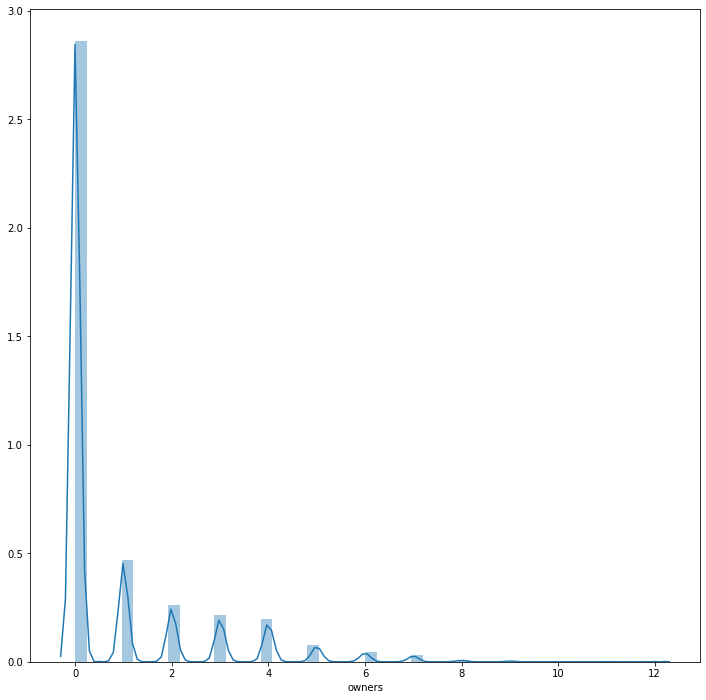

In [12]:
#visualize target distribution
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12,12))
sns.distplot(target_ranked);

plt.rcParams['figure.dpi'] = 72

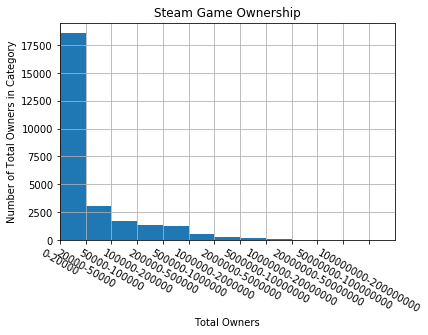

In [14]:
import numpy as np
plt.xticks(np.arange(13),('0-20000', '20000-50000','50000-100000',
               '100000-200000','200000-500000','500000-1000000',
               '1000000-2000000','2000000-5000000',
               '5000000-10000000','10000000-20000000',
               '20000000-50000000','50000000-100000000',
               '100000000-200000000'), rotation=-30)
plt.xlabel('Total Owners')
plt.ylabel('Number of Total Owners in Category')
plt.title('Steam Game Ownership')
# plt.figure(figsize=(20,20))
# plt.text(60, .025, r'$\mu=100,\ \sigma=15$')
plt.xlim(0, 13)
#plt.ylim(0, 0.03)
plt.grid(False)
target_ranked.hist(bins=np.arange(13))
plt.show()

In [15]:
trvc = target_ranked.value_counts()
xt = ['0-20000', '20000-50000','50000-100000',
               '100000-200000','200000-500000','500000-1000000',
               '1000000-2000000','2000000-5000000',
               '5000000-10000000','10000000-20000000',
               '20000000-50000000','50000000-100000000',
               '100000000-200000000']
testt = pd.Series(data=trvc.values, index=xt)
testt

0-20000                18596
20000-50000             3059
50000-100000            1695
100000-200000           1386
200000-500000           1272
500000-1000000           513
1000000-2000000          288
2000000-5000000          193
5000000-10000000          46
10000000-20000000         21
20000000-50000000          3
50000000-100000000         2
100000000-200000000        1
dtype: int64

In [16]:
testt

0-20000                18596
20000-50000             3059
50000-100000            1695
100000-200000           1386
200000-500000           1272
500000-1000000           513
1000000-2000000          288
2000000-5000000          193
5000000-10000000          46
10000000-20000000         21
20000000-50000000          3
50000000-100000000         2
100000000-200000000        1
dtype: int64

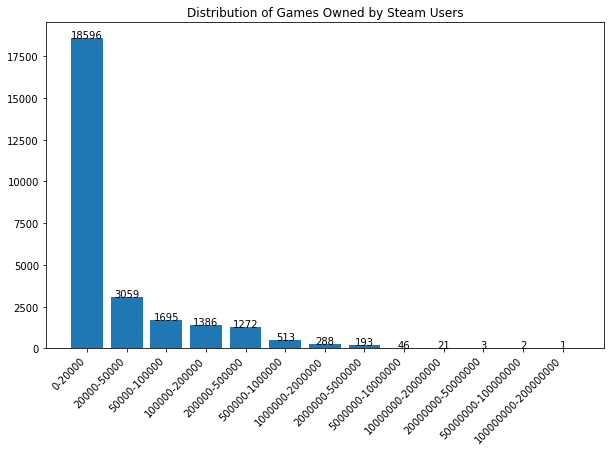

In [22]:

fig = plt.figure(figsize=(10,6))
plt.bar(testt.index, testt)
plt.xticks(rotation=45, horizontalalignment='right')
plt.title('Distribution of Games Owned by Steam Users')

for x,y in zip(testt.index, testt):
  plt.annotate("{:.0f}".format(y),(x,y), horizontalalignment='center')

plt.show()

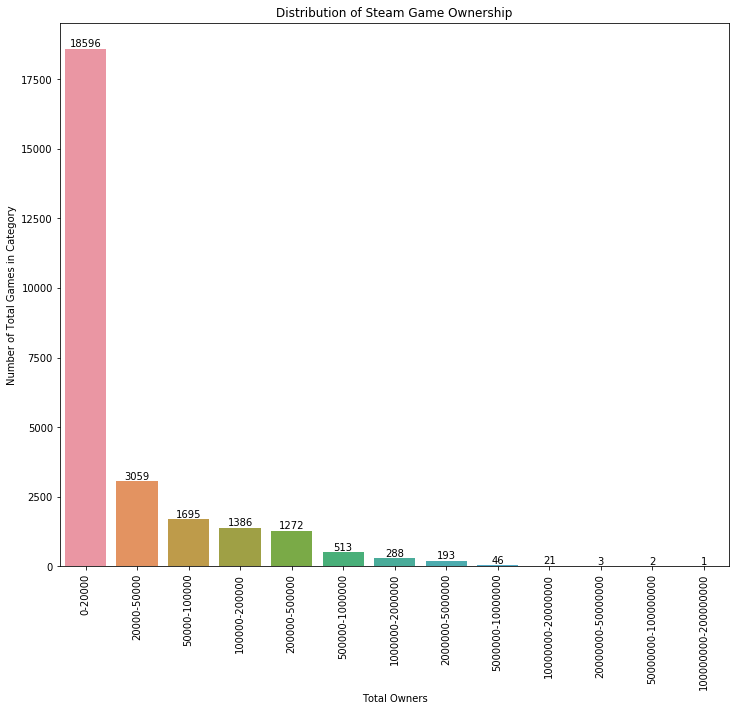

In [19]:
fig, ax = plt.subplots()
ax = sns.barplot(x=testt.index, y=testt, data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
fig.set_size_inches(12, 10)
plt.xlabel('Total Owners')
plt.ylabel('Number of Total Games in Category')
plt.title('Distribution of Steam Game Ownership')

for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_height()), 
                        (p.get_x() + p.get_width() / 2.0, 
                         p.get_height()), 
                        ha = 'center', 
                        va = 'center', 
                        xytext = (0, 5),
                        textcoords = 'offset points')

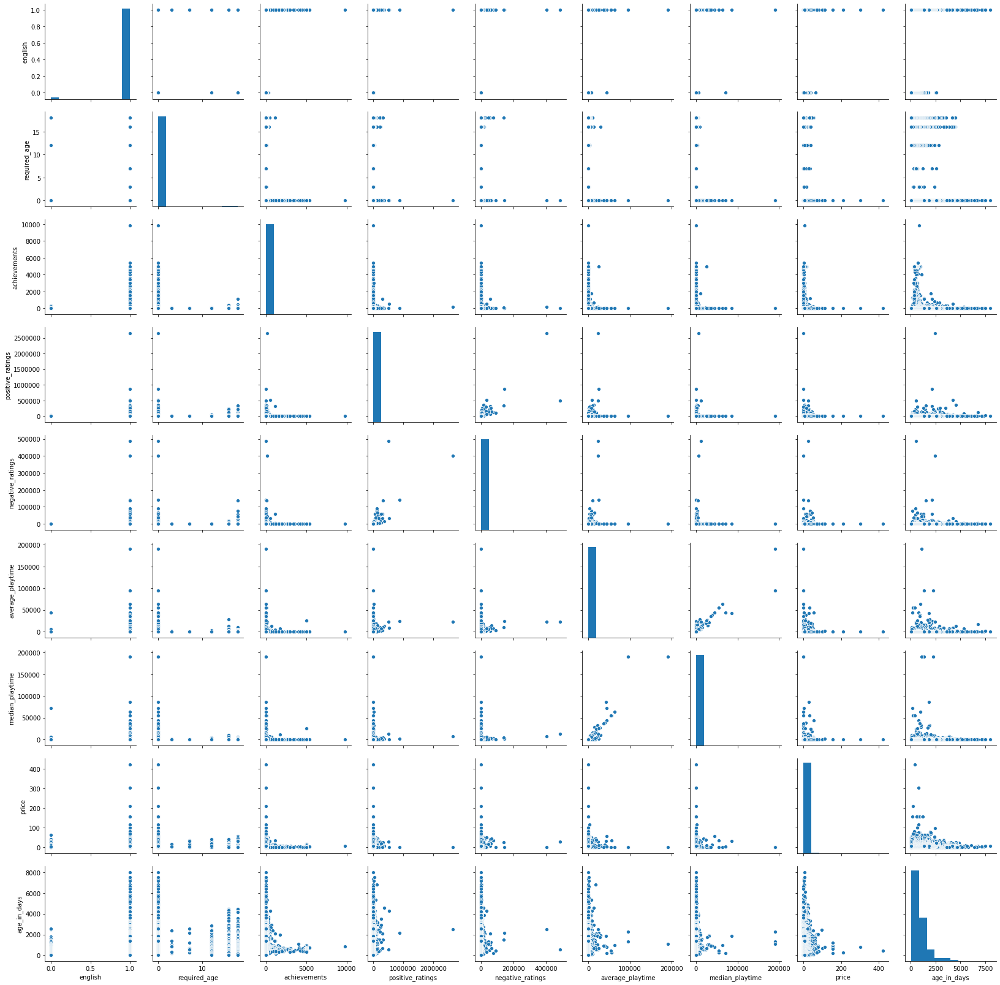

In [21]:
#visualize feature interactions
ax = sns.pairplot(df[features])

In [23]:
from sklearn.model_selection import train_test_split

# get train and test sets from the original dataframe
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)
print(X_train.shape, X_test.shape)

# get val by splitting train again
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
print(X_train.shape, X_val.shape)

(21660, 13) (5415, 13)
(17328, 13) (4332, 13)


In [25]:
#Random Forest Classifier
!pip install category_encoders
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier

In [26]:
rfc_pipe = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(),
    RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1),
)

rfc_pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['developer', 'publisher', 'genres',
                                      'platforms'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='value',
                                mapping=[{'col': 'developer',
                                          'data_type': dtype('O'),
                                          'mapping': Choice of Games                         1
Super Mega Team                         2
Sports Interactive                      3
BatCat Games                            4
Rufoid AB                               5
Kastriot Sulejmani                      6
gfdsahdgsye7                            7
Aidan Gignac...
                ('randomforestclassifier',
                 RandomForestClassifier(bootstrap=True, class_weight=None,
                                        criterion='gini', max_depth=None,

In [27]:
rfc_pipe.score(X_val, y_val)

0.8114035087719298

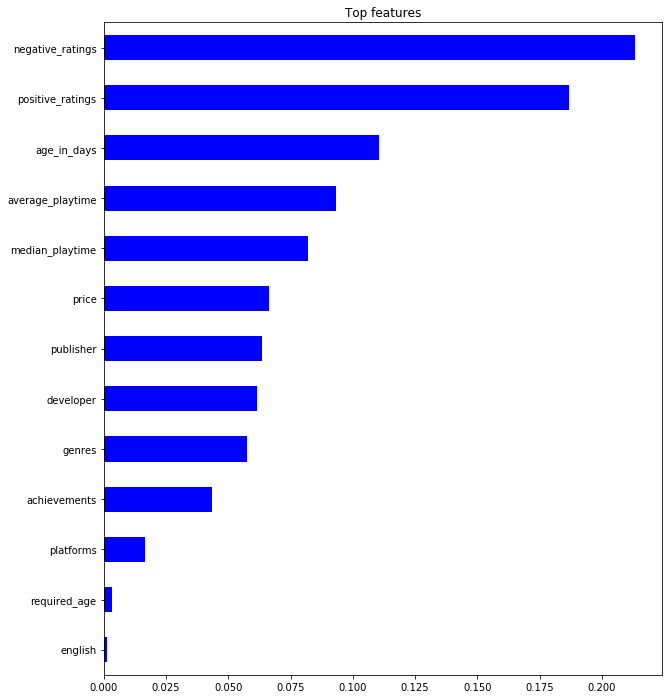

In [29]:
# Get feature importances
rf = rfc_pipe.named_steps['randomforestclassifier']
importances = pd.Series(rf.feature_importances_, X_train.columns)

# Plot feature importances
%matplotlib inline
import matplotlib.pyplot as plt


plt.figure(figsize=(10,12))
plt.title(f'Top features')
importances.sort_values().plot.barh(color='blue');

In [30]:
#find the best hyperparameters (ignored due to better initial score)
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

p_dist = {
    'randomforestclassifier__n_estimators': randint(50,500),
    'randomforestclassifier__max_depth':[5,10,15,20, None],
    'randomforestclassifier__max_features': uniform(0,1),
}

rfc_search = RandomizedSearchCV(
    rfc_pipe,
    param_distributions = p_dist,
    n_iter=10,
    cv=4,
    scoring='accuracy',
    verbose=10,
    return_train_score=True,
    n_jobs=-1
)

rfc_search.fit(X_train, y_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits


C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=4.
  % (min_groups, self.n_splits)), Warning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done  14 out of  40 | elapsed:   23.3s remaining:   43.3s
[Parallel(n_jobs=-1)]: Done  19 out of  40 | elapsed:   29.1s remaining:   32.2s
[Parallel(n_jobs=-1)]: Done  24 out of  40 | elapsed:   40.2s remaining:   26.8s
[Parallel(n_jobs=-1)]: Done  29 out of  40 | elapsed:   43.5s remaining:   16.4s
[Parallel(n_jobs=-1)]: Done  34 out of  40 | elapsed:   44.0s remaining:    7.7s
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   45.2s finished


RandomizedSearchCV(cv=4, error_score='raise-deprecating',
                   estimator=Pipeline(memory=None,
                                      steps=[('ordinalencoder',
                                              OrdinalEncoder(cols=['developer',
                                                                   'publisher',
                                                                   'genres',
                                                                   'platforms'],
                                                             drop_invariant=False,
                                                             handle_missing='value',
                                                             handle_unknown='value',
                                                             mapping=[{'col': 'developer',
                                                                       'data_type': dtype('O'),
                                                                     

In [31]:
print('Best Hyperparameters:', rfc_search.best_params_)
print('Accuracy:', rfc_search.best_score_)

Best Hyperparameters: {'randomforestclassifier__max_depth': 20, 'randomforestclassifier__max_features': 0.40952038235269994, 'randomforestclassifier__n_estimators': 200}
Accuracy: 0.8018236380424746


In [33]:
###Try an XGBoost Classifier###
!pip install xgboost
from xgboost import XGBClassifier

xgb_pipe = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(),
    XGBClassifier(n_estimators=100, random_state = 42, n_jobs = -1)
)

xgb_pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['developer', 'publisher', 'genres',
                                      'platforms'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='value',
                                mapping=[{'col': 'developer',
                                          'data_type': dtype('O'),
                                          'mapping': Choice of Games                         1
Super Mega Team                         2
Sports Interactive                      3
BatCat Games                            4
Rufoid AB                               5
Kastriot Sulejmani                      6
gfdsahdgsye7                            7
Aidan Gignac...
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gam

In [34]:
xgb_pipe.score(X_val, y_val)

0.793859649122807

In [35]:
#try a logistic regression model
from sklearn.linear_model import LogisticRegressionCV

LR_pipeline = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(),
    LogisticRegressionCV(cv=5, n_jobs=-1, random_state = 42)
)
LR_pipeline.fit(X_train, y_train)

C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:9

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['developer', 'publisher', 'genres',
                                      'platforms'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='value',
                                mapping=[{'col': 'developer',
                                          'data_type': dtype('O'),
                                          'mapping': Choice of Games                         1
Super Mega Team                         2
Sports Interactive                      3
BatCat Games                            4
Rufoid AB                               5
Kastriot Sulejmani                      6
gfdsahdgsye7                            7
Aidan Gignac...
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='mean',
                               verbose=0)),

In [36]:
LR_pipeline.score(X_val, y_val)

0.7354570637119113

In [108]:
#try logregression (couldn't get to work)
#Try a linear model
# from xgboost import XGBRegressor

# xgbr_pipe = make_pipeline(
#     ce.OrdinalEncoder(),
#     SimpleImputer(),
#     XGBRegressor(n_estimators=100, n_jobs=-1),
# )

# xgbr_pipe.fit(X_train, y_train)

In [37]:
#prep for finding permutation importances
transformer = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(strategy='median')
)

X_train_t = transformer.fit_transform(X_train)
X_val_t = transformer.fit_transform(X_val)

RFC_prep_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs = -1)
RFC_prep_model.fit(X_train_t, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [39]:
!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance

permuter = PermutationImportance(
    RFC_prep_model,
    scoring='accuracy',
    n_iter=5,
    random_state=42,
)

permuter.fit(X_val_t, y_val)

  Stored in directory: C:\Users\eneph\AppData\Local\pip\Cache\wheels\9c\9b\f4\eb243fdb89676ec00588e8c54bb54360724c06e7fafe95278e
Successfully built tabulate


PermutationImportance(cv='prefit',
                      estimator=RandomForestClassifier(bootstrap=True,
                                                       class_weight=None,
                                                       criterion='gini',
                                                       max_depth=None,
                                                       max_features='auto',
                                                       max_leaf_nodes=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                                       min_weight_fraction_leaf=0.0,
                                                       n_estimators=100,
                                                     

In [40]:
f_names = X_val.columns.tolist()
pd.Series(permuter.feature_importances_, f_names).sort_values(ascending=False)

negative_ratings    8.910434e-02
positive_ratings    7.576177e-02
age_in_days         3.873500e-02
average_playtime    3.162512e-02
price               2.991690e-02
median_playtime     2.834718e-02
genres              7.433056e-03
achievements        6.648199e-03
publisher           6.048015e-03
platforms           4.432133e-03
developer           2.677747e-03
english             5.078486e-04
required_age       -2.220446e-17
dtype: float64

In [41]:
feature_names = X_val.columns.tolist()

eli5.show_weights(
    permuter,
    top=None, # show permutation importances for all features
    feature_names=feature_names
)

Weight,Feature
0.0891 ± 0.0048,negative_ratings
0.0758 ± 0.0048,positive_ratings
0.0387 ± 0.0040,age_in_days
0.0316 ± 0.0036,average_playtime
0.0299 ± 0.0037,price
0.0283 ± 0.0029,median_playtime
0.0074 ± 0.0024,genres
0.0066 ± 0.0027,achievements
0.0060 ± 0.0032,publisher
0.0044 ± 0.0040,platforms


In [42]:
df['required_age'].value_counts()

0     26479
18      308
16      192
12       73
7        12
3        11
Name: required_age, dtype: int64

In [43]:
X = df[features]
y = df[target]

encoder = ce.OrdinalEncoder()
X_encoded = encoder.fit_transform(X)
# y_encoded = encoder.fit_transform(y)

n_model = RandomForestClassifier(n_estimators = 100, random_state=42, n_jobs=-1)
n_model.fit(X_encoded, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\eneph\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:9

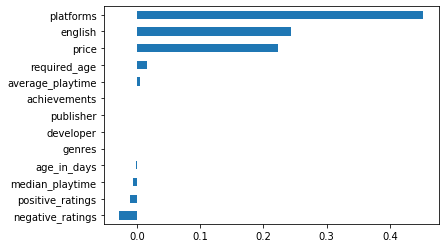

In [45]:
encoder = ce.OrdinalEncoder()
X_train_encoded = encoder.fit_transform(X_train)
l_model = LogisticRegressionCV(cv=5, n_jobs=-1, random_state = 42)
l_model.fit(X_train_encoded, y_train)

coefficients = pd.Series(l_model.coef_[0], features)
coefficients.sort_values().plot.barh();

In [46]:
#pick a row
row = X_test.iloc[[0]]
row

,developer,publisher,english,required_age,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,price,genres,platforms,age_in_days
10506,Luke Cripps,Fellowplayer,1,0,14,6,3,0,0,0.99,Indie,windows,1017


In [47]:
#pick another row (different target categories)
row2 = X_test.iloc[[3]]
row2

,developer,publisher,english,required_age,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,price,genres,platforms,age_in_days
1489,SkyGoblin,SkyGoblin,1,0,0,902,129,303,327,5.99,Adventure;Indie,windows;mac;linux,2334


In [48]:
processor = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(strategy='median')
)
d_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

X_t_pro = processor.fit_transform(X_train)
X_v_pro = processor.transform(X_val)
eval_set =[(X_t_pro, y_train), (X_v_pro, y_val)]

d_model.fit(X_t_pro, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [49]:
#check to see the target value for clarity
df[10506:10507]

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,age_in_days
10506,514520,Sparky's Hunt,2016-08-18,1,Luke Cripps,Fellowplayer,windows,0,Single-player,Indie,Indie;Horror,14,6,3,0,0,0,0.99,1017


In [51]:
!pip install shap
import shap

explainer = shap.TreeExplainer(d_model)
row_processed = processor.transform(row)
shap_v = explainer.shap_values(row_processed)
len(shap_v)

13

In [52]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[0],
    shap_values=shap_v[0],
    features=row,
    link='logit'
)

In [53]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[1],
    shap_values=shap_v[1],
    features=row,
    link='logit'
)

In [54]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[12],
    shap_values=shap_v[12],
    features=row,
    link='logit'
)

In [55]:
explainer = shap.TreeExplainer(d_model)
row_processed = processor.transform(row2)
shap_v = explainer.shap_values(row_processed)

In [56]:
#look at the target value of row2
df[1489:1490]

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,age_in_days
1489,220090,The Journey Down: Chapter One,2013-01-09,1,SkyGoblin,SkyGoblin,windows;mac;linux,0,Single-player;Steam Trading Cards,Adventure;Indie,Adventure;Point & Click;Indie,0,902,129,303,327,4,5.99,2334


In [57]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[4],
    shap_values=shap_v[4],
    features=row,
    link='logit'
)

  Stored in directory: C:\Users\eneph\AppData\Local\pip\Cache\wheels\7d\08\51\63fd122b04a2c87d780464eeffb94867c75bd96a64d500a3fe
Successfully built pdpbox


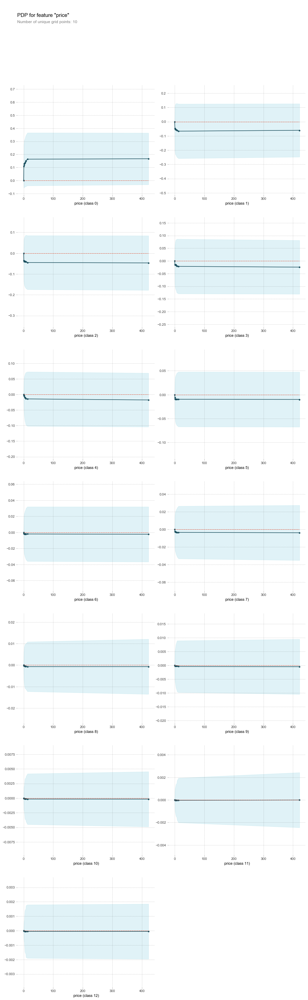

In [59]:
#look at some partial dependence plots
%matplotlib inline
!pip install pdpbox
import matplotlib.pyplot as plt
from pdpbox import pdp
pdp_feature='price'
pdp_dist = pdp.pdp_isolate(model=n_model, dataset=X_encoded, 
                           model_features=features, feature = pdp_feature)
pdp.pdp_plot(pdp_dist, pdp_feature);

In [60]:
encoder.mapping

[{'col': 'developer', 'mapping': Choice of Games                         1
  Super Mega Team                         2
  Sports Interactive                      3
  BatCat Games                            4
  Rufoid AB                               5
  Kastriot Sulejmani                      6
  gfdsahdgsye7                            7
  Aidan Gignac                            8
  Shahzeb A.                              9
  GDNomad                                10
  Dieselmine                             11
  Nikita "Ghost_RUS"                     12
  Daedalic Entertainment                 13
  Studio Pixel                           14
  木子工坊                                   15
  Isaac Stearns                          16
  HexWar Games                           17
  Graffiti                               18
  Auroch Digital                         19
  EnsenaSoft                             20
  Dreadlocks Mobile;Silicon Jelly        21
  Bat Byte                               22
  PRO2131                                23
  id Software                            24
  increpare games                        25
  Solid Dev                              26
  West Coast Software                    27
  GameTop.com                            28
  NIGORO                                 29
  Goober Games                           30
                                      ...  
  Machineman1357;Phanom Games         11957
  Fat Panda Games                     11958
  WOLCEN Studio                       11959
  Black Hand Studio                   11960
  PlayUn-Gaming                       11961
  Marshall Latimer                    11962
  Illeris                             11963
  Numicus Studios                     11964
  OxPrime Studio                      11965
  Christian Hamm;Michail Ostrowski    11966
  KIRA                                11967
  Drift Physics Crew                  11968
  GabberGames.com                     11969
  AmazeVR, Inc                        11970
  The Dashing Crate                   11971
  Caleb Hooper;Christian Hooper       11972
  Das Humankapital                    11973
  Wanin International                 11974
  Refocus Solutions                   11975
  Fireglow                            11976
  DiPi Games                          11977
  NyberRoar Interactive               11978
  4ShawGames                          11979
  Old Doorways Ltd                    11980
  Headbang Club                       11981
  Amusitronix                         11982
  Cartboard Games                     11983
  Coldwood Interactive                11984
  Dudarev Alexandr Vladimirovich      11985
  NaN                                    -2
  Length: 11986, dtype: int64, 'data_type': dtype('O')},
 {'col': 'publisher', 'mapping': Choice of Games                             1
  Adult Swim Games                            2
  SEGA                                        3
  BatCat Games                                4
  Rufoid AB                                   5
  Kastriot Sulejmani                          6
  gfdsahdgsye7                                7
  Aidan Gignac                                8
  Kyle K.                                     9
  Infernal Dream                             10
  Dieselmine                                 11
  Ghost_RUS Games                            12
  Daedalic Entertainment                     13
  AGM PLAYISM                                14
   HongbinGame                               15
  Isaac Stearns                              16
  HexWar Games                               17
  Interplay                                  18
  Auroch Digital                             19
  EnsenaSoft                                 20
  Dreadlocks Mobile;Silicon Jelly            21
  Bat Byte                                   22
  PRO2131 LLC                                23
  id Software                                24
  increpare games                            

In [61]:
def pdp_isolate_explain(X, y, feature):
    import category_encoders as ce
    from sklearn.pipeline import make_pipeline
    from sklearn.impute   import SimpleImputer
    from sklearn.ensemble import RandomForestClassifier
    from pdpbox.pdp       import pdp_isolate, pdp_plot
    # Encode, impute as needed
    X_encoded   = ce.OrdinalEncoder().fit_transform(X)
    X_processed = SimpleImputer().fit_transform(X_encoded)
    # Pick a model and fit the data
    pdp_model = RandomForestClassifier(n_estimators = 200
                                      ,n_jobs       = -1
                                      ,random_state = 6
                                      )
    pdp_model.fit(X_processed
                 ,y
                 )
    # The actual plotting
    pdp_isolate = pdp_isolate(model          = pdp_model
                             ,dataset        = X_encoded
                             ,model_features = X_encoded.columns
                             ,feature        = feature
                             )
    pdp_plot(pdp_isolate
            ,feature_name = feature
            ,plot_lines   = True
            ,frac_to_plot = 100
            )

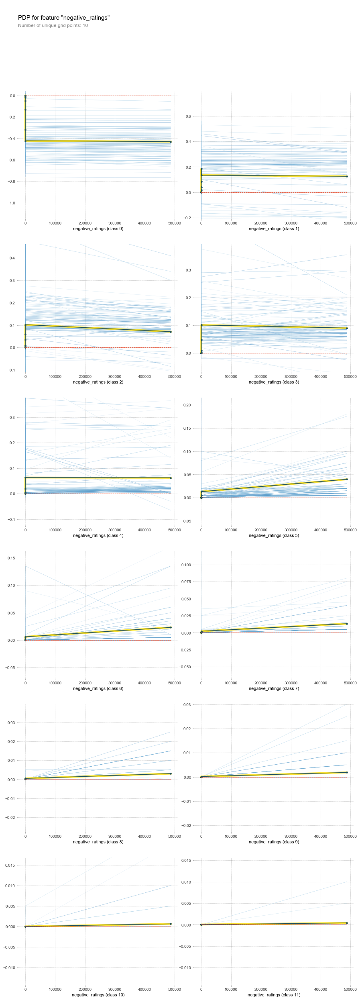

In [62]:
pdp_isolate_explain(X_test, y_test, 'negative_ratings')

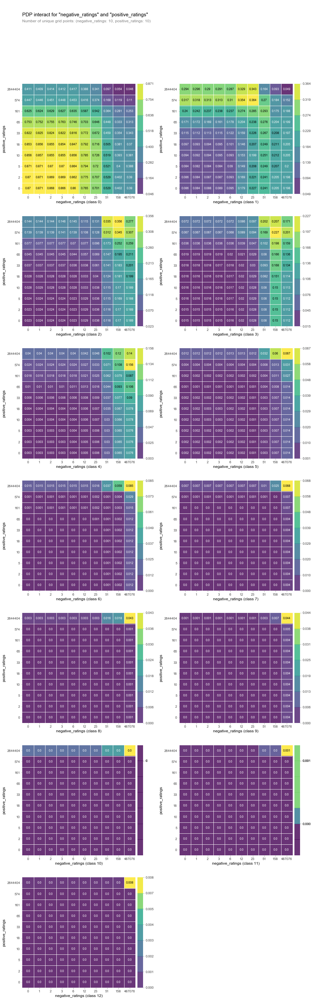

In [63]:
#pdp interact for further exploration
from pdpbox.pdp import pdp_interact, pdp_interact_plot
features = ['negative_ratings', 'positive_ratings']

interaction = pdp_interact(
    model=rfc_pipe, 
    dataset=X_encoded, 
    model_features=X_encoded.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', feature_names=features);

In [65]:
!pip install plotly
import plotly.express as px
px.scatter(df, x='owners', y='negative_ratings', trendline='ols')
#as you can tell, something is wrong with the runtime as I have to install everything

  Stored in directory: C:\Users\eneph\AppData\Local\pip\Cache\wheels\d7\a9\33\acc7b709e2a35caa7d4cae442f6fe6fbf2c43f80823d46460c
Successfully built retrying


In [66]:
px.scatter(df, x='owners', y='positive_ratings')

In [68]:
y_pred = rfc_pipe.predict(X_val)

In [69]:
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [70]:
from sklearn.utils.multiclass import unique_labels
unique_labels(y_val)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

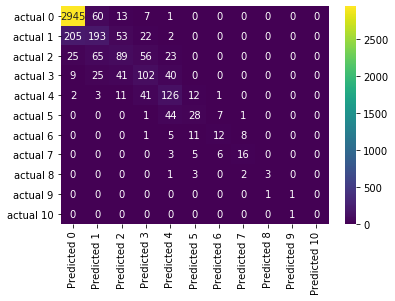

In [71]:
!pip install matplotlib==3.1.0 #due to plot visualization cut-off
#visualization in blog post were this code cell slightly altered in colab
#due to runtime problems in Anaconda
from sklearn.metrics import confusion_matrix

def plot_conf_mat(y_true, y_pred):
    labels = unique_labels(y_true)
    columns = [f'Predicted {label}' for label in labels]
    index = [f'actual {label}' for label in labels]
    table = pd.DataFrame(confusion_matrix(y_true, y_pred), columns=columns, index=index)
    return sns.heatmap(table, annot=True, fmt='d', cmap='viridis')

plot_conf_mat(y_val, y_pred)